TransWeather 四种方法评估与对比
本notebook用于评估和对比四种方法的实验结果：
1. Baseline (原始TransWeather)
2. Multiscale (多尺度融合)
3. Aug (数据增强)
4. Combined (多尺度融合 + 数据增强)


In [17]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'DejaVu Sans']  # 支持中文显示
matplotlib.rcParams['axes.unicode_minus'] = False  # 解决负号显示问题

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
from torchvision.transforms import Compose, ToTensor, Normalize

# 导入模型和工具
import sys
sys.path.append('.')
from model import Transweather
from model_multiscale import TransweatherMultiScale
from dataset import WeatherDataset
from train_utils import calc_psnr, calc_ssim

# 配置
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f'使用设备: {device}')


使用设备: cuda:0


1. 解析训练日志文件


In [18]:
# 方法名称和颜色配置
method_names_cn = {
    'baseline': 'Baseline',
    'multiscale': 'Multiscale',
    'aug': 'Aug',
    'combined': 'Combined'
}

method_colors = {
    'baseline': '#1f77b4',
    'multiscale': '#ff7f0e',
    'aug': '#2ca02c',
    'combined': '#d62728'
}

def parse_log_file(log_path):
    """解析训练日志文件，提取训练指标"""
    epochs = []
    train_psnr = []
    val_psnr = []
    val_ssim = []
    
    if not os.path.exists(log_path):
        print(f'警告: 日志文件不存在: {log_path}')
        return None
    
    with open(log_path, 'r') as f:
        for line in f:
            # 匹配格式: Date: ..., Time_Cost: ...s, Epoch: [x/200], Train_PSNR: ..., Val_PSNR: ..., Val_SSIM: ...
            match = re.search(r'Epoch: \[(\d+)/\d+\], Train_PSNR: ([\d.]+), Val_PSNR: ([\d.]+), Val_SSIM: ([\d.]+)', line)
            if match:
                epoch = int(match.group(1))
                train_p = float(match.group(2))
                val_p = float(match.group(3))
                val_s = float(match.group(4))
                
                epochs.append(epoch)
                train_psnr.append(train_p)
                val_psnr.append(val_p)
                val_ssim.append(val_s)
    
    if len(epochs) == 0:
        print(f'警告: 未能从日志文件中解析到数据: {log_path}')
        return None
    
    return {
        'epochs': epochs,
        'train_psnr': train_psnr,
        'val_psnr': val_psnr,
        'val_ssim': val_ssim
    }

# 解析四个方法的训练日志
methods = {
    'baseline': {'log': './training_log/test_log.txt', 'model_type': 'baseline'},
    'multiscale': {'log': './training_log/multiscale_log.txt', 'model_type': 'multiscale'},
    'aug': {'log': './training_log/aug_log.txt', 'model_type': 'baseline'},
    'combined': {'log': './training_log/combined_log.txt', 'model_type': 'multiscale'}
}

training_data = {}
for method_name, method_info in methods.items():
    log_path = method_info['log']
    data = parse_log_file(log_path)
    if data is not None:
        training_data[method_name] = {
            'data': data,
            'model_type': method_info['model_type'],
            'model_path': f'./weights/{method_name}/best'
        }
        print(f'{method_name}: 成功解析 {len(data["epochs"])} 个epoch的数据')
    else:
        print(f'{method_name}: 解析失败')

print(f'\n成功加载 {len(training_data)} 个方法的训练数据')


baseline: 成功解析 200 个epoch的数据
multiscale: 成功解析 200 个epoch的数据
aug: 成功解析 200 个epoch的数据
combined: 成功解析 200 个epoch的数据

成功加载 4 个方法的训练数据


2. 四种方法在测试集上的PSNR和SSIM

In [10]:
# ============ 配置测试集路径 ============
# 注意：如果使用相对路径，应该相对于当前工作目录
# 当前工作目录应该是 transweather_simple/
test_data_dir = './data/test/'  # 修改为您的测试集路径（使用 ./ 表示当前目录）
# test_data_dir = '/home2/zzj/new-Transweather/transweather_simple/data/test/'  # 或使用绝对路径
test_filename = 'allfilter.txt'  # 测试集列表文件名
# ==========================================

# 转换为绝对路径
if not os.path.isabs(test_data_dir):
    # 如果test_data_dir是相对路径，转换为绝对路径
    test_data_dir = os.path.abspath(test_data_dir)
print(f'转换后的测试集目录: {test_data_dir}')

# 确保test_data_dir以/结尾（Windows需要\，Linux需要/）
if not test_data_dir.endswith(os.sep):
    test_data_dir = test_data_dir + os.sep

# 检查测试集目录是否存在
if not os.path.exists(test_data_dir):
    print(f'警告: 测试集目录不存在: {test_data_dir}')
    print(f'请检查路径是否正确')
else:
    print(f'测试集目录: {test_data_dir}')
    list_file = os.path.join(test_data_dir, test_filename)
    if os.path.exists(list_file):
        print(f'测试列表文件存在: {list_file}')
        # 读取前几行检查路径格式
        with open(list_file, 'r') as f:
            first_lines = [f.readline().strip() for _ in range(5)]
        print(f'文件列表前5行示例:')
        for i, line in enumerate(first_lines):
            if line:
                # 清理路径：移除开头的 allfilter/ 前缀（如果存在）
                clean_line = line
                if clean_line.startswith('allfilter/'):
                    clean_line = clean_line[len('allfilter/'):]
                if clean_line.startswith('allfilter\\'):
                    clean_line = clean_line[len('allfilter\\'):]
                
                print(f'  {i+1}: 原始路径: {line}')
                print(f'      清理后: {clean_line}')
                # 检查路径是否存在
                full_path = os.path.join(test_data_dir, clean_line)
                exists = os.path.exists(full_path)
                print(f'      完整路径: {full_path} [{"存在" if exists else "不存在"}]')
    else:
        print(f'警告: 测试列表文件不存在: {list_file}')

# 创建一个自定义数据集类，自动清理路径前缀
class CleanPathWeatherDataset(WeatherDataset):
    """清理路径前缀的数据集类，自动移除 allfilter/ 前缀"""
    def __init__(self, data_dir, filename, crop_size=None, mode='train'):
        # 初始化父类 Dataset
        import torch.utils.data as data
        data.Dataset.__init__(self)
        
        # 读取文件列表并清理路径
        data_list = os.path.join(data_dir, filename)
        
        if not os.path.exists(data_list):
            raise FileNotFoundError(f'数据列表文件不存在: {data_list}')
        
        with open(data_list, 'r') as f:
            contents = f.readlines()
            input_names_raw = [i.strip() for i in contents if i.strip()]
        
        # 清理路径：移除 allfilter/ 前缀（如果存在）
        input_names = []
        for name in input_names_raw:
            clean_name = name
            # 移除 allfilter/ 或 allfilter\ 前缀
            if clean_name.startswith('allfilter/'):
                clean_name = clean_name[len('allfilter/'):]
            elif clean_name.startswith('allfilter\\'):
                clean_name = clean_name[len('allfilter\\'):]
            input_names.append(clean_name)
        
        # 设置属性（和父类WeatherDataset相同的属性）
        self.input_names = input_names
        self.gt_names = [name.replace('input', 'gt') for name in input_names]
        self.crop_size = crop_size
        self.data_dir = data_dir
        self.mode = mode
    
    # 不需要重写其他方法，因为父类的 __getitem__ 和 __len__ 已经使用了 self.input_names

def load_model(model_path, model_type='baseline', device=device):
    """加载模型"""
    if model_type == 'multiscale':
        net = TransweatherMultiScale()
    else:
        net = Transweather()
    
    checkpoint = torch.load(model_path, map_location=device)
    
    # 处理DataParallel保存的模型
    if isinstance(checkpoint, dict) and any('module.' in str(k) for k in checkpoint.keys()):
        new_state_dict = {}
        for k, v in checkpoint.items():
            name = k[7:] if k.startswith('module.') else k
            new_state_dict[name] = v
        net.load_state_dict(new_state_dict)
    else:
        net.load_state_dict(checkpoint)
    
    net = net.to(device)
    net.eval()
    return net

def evaluate_on_testset(model_path, model_type, test_data_dir, test_filename, device=device):
    """在测试集上评估模型"""
    # 加载模型
    net = load_model(model_path, model_type, device)
    
    # 创建测试数据集
    if not os.path.exists(test_data_dir):
        print(f'警告: 测试集目录不存在: {test_data_dir}')
        return None, None
    
    # 使用单线程加载数据，避免多进程路径问题
    # 使用清理路径的数据集类
    test_dataset = CleanPathWeatherDataset(
        data_dir=test_data_dir,
        filename=test_filename,
        crop_size=None,
        mode='val'
    )
    
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=0,  # 改为0，避免多进程路径问题
        pin_memory=False
    )
    
    # 计算指标
    psnr_list = []
    ssim_list = []
    
    print(f'开始评估测试集，共 {len(test_loader)} 张图像...')
    with torch.no_grad():
        for batch_id, test_data in enumerate(test_loader):
            input_im, gt, _ = test_data
            input_im = input_im.to(device)
            gt = gt.to(device)
            
            # 推理
            pred_image = net(input_im)
            
            # 计算PSNR和SSIM
            psnr_list.extend(calc_psnr(pred_image, gt))
            ssim_list.extend(calc_ssim(pred_image, gt))
            
            if (batch_id + 1) % 50 == 0:
                print(f'  已处理: {batch_id + 1}/{len(test_loader)}')
    
    avg_psnr = sum(psnr_list) / len(psnr_list)
    avg_ssim = sum(ssim_list) / len(ssim_list)
    
    return avg_psnr, avg_ssim

# 评估所有方法
test_results = {}
for method_name, method_info in training_data.items():
    model_path = method_info['model_path']
    model_type = method_info['model_type']
    
    if os.path.exists(model_path):
        print(f'\n评估 {method_name}...')
        psnr, ssim = evaluate_on_testset(model_path, model_type, test_data_dir, test_filename, device)
        if psnr is not None:
            test_results[method_name] = {'PSNR': psnr, 'SSIM': ssim}
            print(f'{method_name} - PSNR: {psnr:.2f} dB, SSIM: {ssim:.4f}')
    else:
        print(f'警告: 模型文件不存在: {model_path}')

# 显示结果表格
if test_results:
    df = pd.DataFrame(test_results).T
    df = df.round({'PSNR': 2, 'SSIM': 4})
    print('\n' + '='*50)
    print('测试集评估结果:')
    print('='*50)
    print(df.to_string())
    print('='*50)


转换后的测试集目录: /home2/zzj/new-Transweather/transweather_simple/data/test
测试集目录: /home2/zzj/new-Transweather/transweather_simple/data/test/
测试列表文件存在: /home2/zzj/new-Transweather/transweather_simple/data/test/allfilter.txt
文件列表前5行示例:
  1: 原始路径: input/winter__street_04648.jpg
      清理后: input/winter__street_04648.jpg
      完整路径: /home2/zzj/new-Transweather/transweather_simple/data/test/input/winter__street_04648.jpg [存在]
  2: 原始路径: input/winter_japan_11047.jpg
      清理后: input/winter_japan_11047.jpg
      完整路径: /home2/zzj/new-Transweather/transweather_simple/data/test/input/winter_japan_11047.jpg [存在]
  3: 原始路径: input/city_read_19895.jpg
      清理后: input/city_read_19895.jpg
      完整路径: /home2/zzj/new-Transweather/transweather_simple/data/test/input/city_read_19895.jpg [存在]
  4: 原始路径: input/winter_park_03526.jpg
      清理后: input/winter_park_03526.jpg
      完整路径: /home2/zzj/new-Transweather/transweather_simple/data/test/input/winter_park_03526.jpg [存在]
  5: 原始路径: input/parking_lot_13674.jpg
   

1. 训练过程指标变化曲线


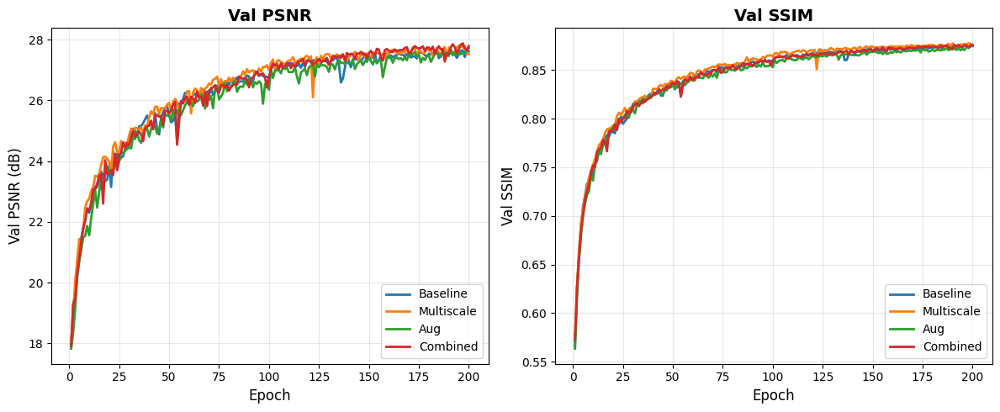

In [20]:
# Plot validation curves
plt.figure(figsize=(12, 5))

# Plot Val_PSNR
plt.subplot(1, 2, 1)
for method_name, method_info in training_data.items():
    data = method_info['data']
    epochs = data['epochs']
    val_psnr = data['val_psnr']
    plt.plot(epochs, val_psnr, label=method_names_cn[method_name], 
             color=method_colors[method_name], linewidth=2)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Val PSNR (dB)', fontsize=12)
plt.title('Val PSNR', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Plot Val_SSIM
plt.subplot(1, 2, 2)
for method_name, method_info in training_data.items():
    data = method_info['data']
    epochs = data['epochs']
    val_ssim = data['val_ssim']
    plt.plot(epochs, val_ssim, label=method_names_cn[method_name], 
             color=method_colors[method_name], linewidth=2)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Val SSIM', fontsize=12)
plt.title('Val SSIM', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_curves.png', dpi=300, bbox_inches='tight')
plt.show()


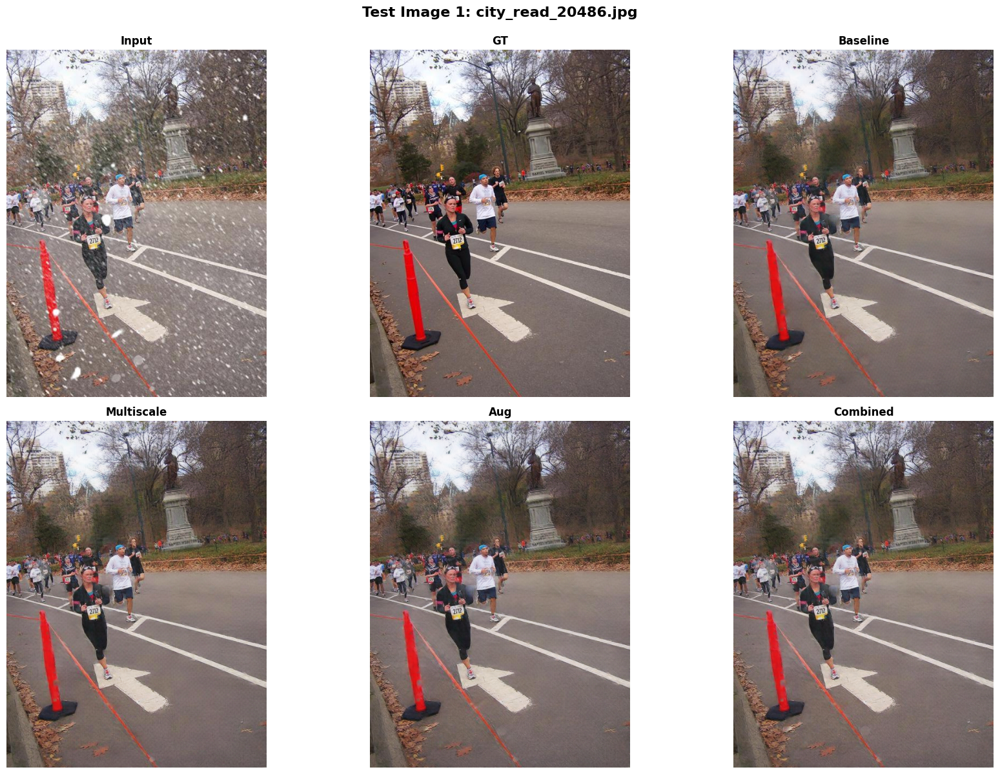


Completed visualization for test image 1


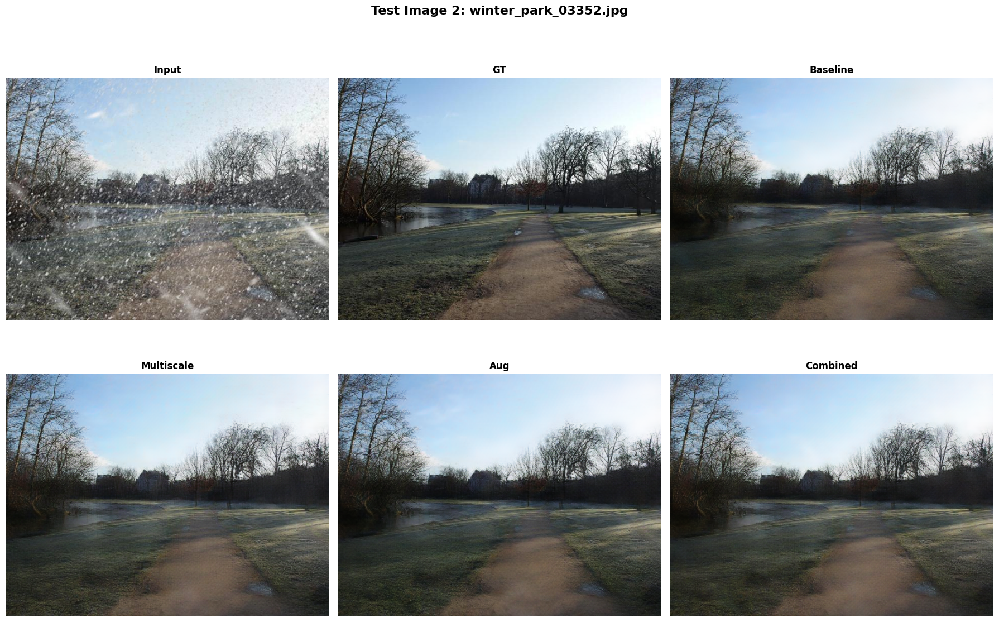


Completed visualization for test image 2


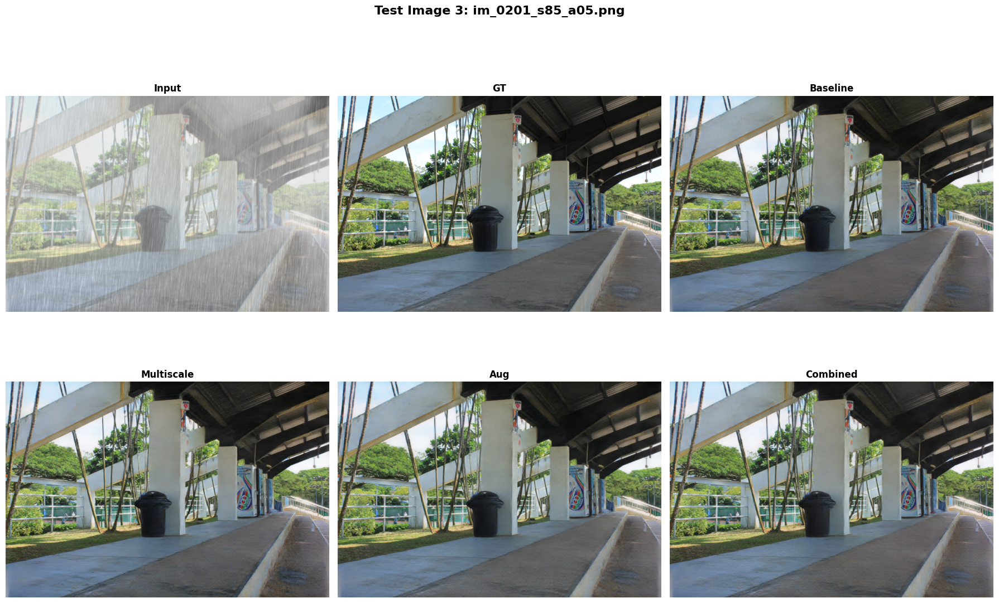


Completed visualization for test image 3


In [23]:
# ============ 配置测试图像路径 ============
# 请修改为您的测试图像路径（相对于test_data_dir的input目录）
test_images = [
    'input/city_read_20486.jpg',  # 第一张测试图像
    'input/winter_park_03352.jpg',  # 第二张测试图像
    'input/im_0201_s85_a05.png'   # 第三张测试图像
]
# ==========================================

def predict_single_image(model_path, model_type, input_path, device=device):
    """对单张图像进行预测"""
    # 加载模型
    net = load_model(model_path, model_type, device)
    
    # 加载和预处理图像
    input_img = Image.open(input_path).convert('RGB')
    
    # 调整图像尺寸为16的倍数
    wd_new, ht_new = input_img.size
    if ht_new > wd_new and ht_new > 1024:
        wd_new = int(np.ceil(wd_new * 1024 / ht_new))
        ht_new = 1024
    elif ht_new <= wd_new and wd_new > 1024:
        ht_new = int(np.ceil(ht_new * 1024 / wd_new))
        wd_new = 1024
    
    wd_new = int(16 * np.ceil(wd_new / 16.0))
    ht_new = int(16 * np.ceil(ht_new / 16.0))
    
    # 兼容新旧版本的PIL/Pillow
    try:
        from PIL.Image import Resampling
        ANTIALIAS = Resampling.LANCZOS
    except ImportError:
        try:
            ANTIALIAS = Image.LANCZOS
        except AttributeError:
            ANTIALIAS = Image.ANTIALIAS
    
    input_img = input_img.resize((wd_new, ht_new), ANTIALIAS)
    
    # 转换为tensor
    transform_input = Compose(
        [ToTensor(), Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
    input_tensor = transform_input(input_img).unsqueeze(0).to(device)
    
    # 推理
    with torch.no_grad():
        output_tensor = net(input_tensor)
    
    # 后处理：从[-1, 1]转换到[0, 1]
    output_tensor = (output_tensor + 1) / 2.0
    output_tensor = torch.clamp(output_tensor, 0, 1)
    
    # 转换为numpy数组
    output_np = output_tensor[0].cpu().permute(1, 2, 0).numpy()
    output_np = (output_np * 255).astype(np.uint8)
    
    return output_np

def get_gt_image(input_path):
    """获取对应的GT图像路径"""
    # 将input路径替换为gt路径
    gt_path = input_path.replace('/input/', '/gt/')
    return gt_path

# 对每张测试图像进行可视化
for img_idx, img_rel_path in enumerate(test_images):
    # 构建完整路径
    input_path = os.path.join(test_data_dir, img_rel_path)
    gt_path = get_gt_image(input_path)
    
    if not os.path.exists(input_path):
        print(f'警告: 输入图像不存在: {input_path}')
        continue
    
    if not os.path.exists(gt_path):
        print(f'警告: GT图像不存在: {gt_path}')
        continue
    
    # 加载原图和GT
    input_img = np.array(Image.open(input_path).convert('RGB'))
    gt_img = np.array(Image.open(gt_path).convert('RGB'))
    
    # 对四种方法进行预测
    predictions = {}
    for method_name, method_info in training_data.items():
        model_path = method_info['model_path']
        model_type = method_info['model_type']
        
        if os.path.exists(model_path):
            try:
                pred_img = predict_single_image(model_path, model_type, input_path, device)
                predictions[method_name] = pred_img
            except Exception as e:
                print(f'预测 {method_name} 时出错: {e}')
    
    # 可视化
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # First row: Input, GT, Baseline
    axes[0, 0].imshow(input_img)
    axes[0, 0].set_title('Input', fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(gt_img)
    axes[0, 1].set_title('GT', fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')
    
    if 'baseline' in predictions:
        axes[0, 2].imshow(predictions['baseline'])
        axes[0, 2].set_title('Baseline', fontsize=12, fontweight='bold')
        axes[0, 2].axis('off')
    else:
        axes[0, 2].text(0.5, 0.5, 'N/A', ha='center', va='center', fontsize=14)
        axes[0, 2].axis('off')
    
    # Second row: Multiscale, Aug, Combined
    methods_row2 = ['multiscale', 'aug', 'combined']
    for idx, method_name in enumerate(methods_row2):
        if method_name in predictions:
            axes[1, idx].imshow(predictions[method_name])
            axes[1, idx].set_title(method_names_cn[method_name], fontsize=12, fontweight='bold')
            axes[1, idx].axis('off')
        else:
            axes[1, idx].text(0.5, 0.5, 'N/A', ha='center', va='center', fontsize=14)
            axes[1, idx].axis('off')
    
    plt.suptitle(f'Test Image {img_idx + 1}: {os.path.basename(img_rel_path)}', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig(f'test_image_{img_idx + 1}_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f'\nCompleted visualization for test image {img_idx + 1}')
